 %%[markdown]

In [1]:
from optuna.visualization.matplotlib import plot_param_importances
from optuna.visualization.matplotlib import plot_optimization_history
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
# import tensorflow as tf
import os
import gc

from sklearn import set_config
from sklearn.base import clone
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from lightgbm import LGBMRegressor
import optuna
from optuna.integration import LightGBMPruningCallback
import lightgbm as lgb


sns.set_theme(style='white', palette='viridis')
pal = sns.color_palette('viridis')

pd.set_option('display.max_rows', 100)
set_config(transform_output='pandas')
pd.options.mode.chained_assignment = None

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


 Read the data

In [2]:
dtypes = {
    'stock_id': np.uint8,
    'date_id': np.uint16,
    'seconds_in_bucket': np.uint16,
    'imbalance_buy_sell_flag': np.int8,
    'time_id': np.uint16,
}

train = pd.read_csv('D:/OneDrive/NEU/CS6140/optiver-trading-at-the-close/train.csv',
                    dtype=dtypes).drop(['row_id', 'time_id'], axis=1)
test = pd.read_csv('D:/OneDrive/NEU/CS6140/optiver-trading-at-the-close/test.csv',
                   dtype=dtypes).drop(['row_id', 'time_id'], axis=1)
train.info()
print(train.head())
gc.collect()

X = train[~train.target.isna()]
y = X.pop('target')

X.info()
print(X.head())
seed = 42
tss = TimeSeriesSplit(10)

os.environ['PYTHONHASHSEED'] = '42'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5237980 entries, 0 to 5237979
Data columns (total 15 columns):
 #   Column                   Dtype  
---  ------                   -----  
 0   stock_id                 uint8  
 1   date_id                  uint16 
 2   seconds_in_bucket        uint16 
 3   imbalance_size           float64
 4   imbalance_buy_sell_flag  int8   
 5   reference_price          float64
 6   matched_size             float64
 7   far_price                float64
 8   near_price               float64
 9   bid_price                float64
 10  bid_size                 float64
 11  ask_price                float64
 12  ask_size                 float64
 13  wap                      float64
 14  target                   float64
dtypes: float64(11), int8(1), uint16(2), uint8(1)
memory usage: 469.6 MB
   stock_id  date_id  seconds_in_bucket  imbalance_size  \
0         0        0                  0      3180602.69   
1         1        0                  0       1666

 Set the objective function for Optuna study and running trials

In [3]:
def objective(trial, X, y):
    param_grid = {
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "max_bin": trial.suggest_int("max_bin", 63, 256),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15)
    }
    cv = tss
    cv_scores = np.empty(10)
    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y)):
        # define train set
        X_train = X.iloc[train_idx]
        y_train = y.iloc[train_idx]

        # define validation set
        X_val = X.iloc[val_idx]
        y_val = y.iloc[val_idx]

        model = LGBMRegressor(random_state=seed, objective='mse',
                              device_type='gpu', early_stopping_rounds=100, **param_grid)
        # train model
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)],  callbacks=[
                  LightGBMPruningCallback(trial, 'l2')])
        val_preds = model.predict(X_val)

        # evaluate model for a fold
        val_score = mean_absolute_error(y_val, val_preds)
        cv_scores[fold] = val_score
    return np.mean(cv_scores)


study = optuna.create_study(direction='minimize', study_name='LGBM Regressor')
def func(trial): return objective(trial, X, y)


study.optimize(func, n_trials=100)

[I 2023-12-02 10:55:06,826] A new study created in memory with name: LGBM Regressor


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1673
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already repo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[133]	valid_0's l2: 115.699
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is alrea

[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1760
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already repor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is alrea

[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already rep

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[195]	valid_0's l2: 79.6356
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Curre

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 377 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 382 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[296]	valid_0's l2: 74.2211


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is alread

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[210]	valid_0's l2: 87.5529
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1765
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[275]	valid_0's l2: 78.747


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[279]	valid_0's l2: 77.9519
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=4.417346395248608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.417346395248608


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
[I 2023-12-02 10:58:18,782] Trial 0 finished with value: 6.427479099084186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16326045259664937, 'num_leaves': 1620, 'max_depth': 5, 'min_data_in_leaf': 5000, 'max_bin': 143, 'min_gain_to_split': 4.417346395248608}. Best is trial 0 with value: 6.427479099084186.


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2758
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is alread

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2849
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[65]	valid_0's l2: 96.5675
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning]

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[159]	valid_0's l2: 79.7143
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is s

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is alread

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[233]	valid_0's l2: 74.2678


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already rep

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 380 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[283]	valid_0's l2: 93.7873
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is s

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already repo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[193]	valid_0's l2: 87.5309
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is s

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is alread

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[115]	valid_0's l2: 79.1397


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 392 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 436 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[346]	valid_0's l2: 78.0701
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.540088613662646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.540088613662646


[I 2023-12-02 11:00:37,711] Trial 1 finished with value: 6.433746315209397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1974686764461974, 'num_leaves': 2920, 'max_depth': 4, 'min_data_in_leaf': 1800, 'max_bin': 246, 'min_gain_to_split': 2.540088613662646}. Best is trial 0 with value: 6.427479099084186.


[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 940
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel wi

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is alread

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[64]	valid_0's l2: 115.81
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warni

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is alread

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[126]	valid_0's l2: 96.3847
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. C

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[157]	valid_0's l2: 79.6361
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 970
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[192]	valid_0's l2: 74.2103
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[149]	valid_0's l2: 87.3914
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 969
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[272]	valid_0's l2: 78.6161
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 969
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-12-02 11:06:07,296] Trial 2 finished with value: 6.4264989698679855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09716285665194598, 'num_leaves': 3000, 'max_depth': 9, 'min_data_in_leaf': 7000, 'max_bin': 76, 'min_gain_to_split': 0.5121220950451078}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2628
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's l2: 115.642
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2719
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's l2: 96.4314


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[49]	valid_0's l2: 79.5298
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2813
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[78]	valid_0's l2: 74.2103


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[119]	valid_0's l2: 87.4875
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2812
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's l2: 78.9059


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[122]	valid_0's l2: 77.9823
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.519469620602605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.519469620602605


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
[I 2023-12-02 11:09:39,050] Trial 3 finished with value: 6.427158719836465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11889388118470545, 'num_leaves': 2140, 'max_depth': 9, 'min_data_in_leaf': 1600, 'max_bin': 233, 'min_gain_to_split': 7.519469620602605}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2077
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already report

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iter

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[51]	valid_0's l2: 96.6078
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is se

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[50]	valid_0's l2: 79.7255
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Curren

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[84]	valid_0's l2: 74.2201
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2205
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[193]	valid_0's l2: 93.6803
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[Light

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[97]	valid_0's l2: 87.4164
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Curren

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's l2: 79.0512
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2208
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[187]	valid_0's l2: 78.1418
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.734177998930615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.734177998930615


[I 2023-12-02 11:12:06,085] Trial 4 finished with value: 6.432876520947305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1766193213882316, 'num_leaves': 1800, 'max_depth': 6, 'min_data_in_leaf': 1200, 'max_bin': 180, 'min_gain_to_split': 3.734177998930615}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=6.576967490034777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.576967490034777
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=6.576967490034777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.576967490034777
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2358
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:12:06,600] Trial 5 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008675 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=6.576967490034777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.576967490034777
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current val

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[66]	valid_0's l2: 115.775
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=10

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[75]	valid_0's l2: 96.2956
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2563
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[120]	valid_0's l2: 110.747
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[105]	valid_0's l2: 79.6077
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[78]	valid_0's l2: 74.2344
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2595
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[106]	valid_0's l2: 93.5401


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Info] This 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[104]	valid_0's l2: 87.4296


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Info] This 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


Early stopping, best iteration is:
[91]	valid_0's l2: 78.738
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value:

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


Early stopping, best iteration is:
[138]	valid_0's l2: 77.8757
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0320733057357112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320733057357112


[I 2023-12-02 11:15:53,817] Trial 6 finished with value: 6.428626967222977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18002662045741322, 'num_leaves': 2260, 'max_depth': 10, 'min_data_in_leaf': 6800, 'max_bin': 213, 'min_gain_to_split': 1.0320733057357112}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=8.102899152065763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.102899152065763
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=8.102899152065763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.102899152065763
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1378
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

[I 2023-12-02 11:15:54,553] Trial 7 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=2.9269184342220806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9269184342220806
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=2.9269184342220806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9269184342220806
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2658
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2

[I 2023-12-02 11:15:55,137] Trial 8 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.401255712463959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401255712463959
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.401255712463959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401255712463959
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1826
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[Light

[I 2023-12-02 11:15:55,734] Trial 9 pruned. Trial was pruned at iteration 3.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=14.917124478289125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.917124478289125
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is

[I 2023-12-02 11:15:56,644] Trial 10 pruned. Trial was pruned at iteration 14.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=7.926032337394632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.926032337394632
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=7.926032337394632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.926032337394632
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 841
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, 

[I 2023-12-02 11:15:57,203] Trial 11 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5982652839355733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5982652839355733
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5982652839355733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5982652839355733
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1312
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[Light

[I 2023-12-02 11:15:57,962] Trial 12 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.378936878954355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.378936878954355
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.378936878954355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.378936878954355
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2178
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:15:58,573] Trial 13 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008395 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.378936878954355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.378936878954355
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:15:59,112] Trial 14 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009893 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=9.510783329500818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.510783329500818
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:15:59,658] Trial 15 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009071 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=5.961575533425898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.961575533425898
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:16:00,337] Trial 16 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=4.398131105336446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.398131105336446
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=4.398131105336446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.398131105336446
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2518
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070,

[I 2023-12-02 11:16:00,879] Trial 17 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.1632269487211842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1632269487211842
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.1632269487211842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1632269487211842
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2044
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[L

[I 2023-12-02 11:16:01,433] Trial 18 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5759161435330586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5759161435330586
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5759161435330586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5759161435330586
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1608
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:16:02,089] Trial 19 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008516 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5759161435330586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5759161435330586
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:16:02,622] Trial 20 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008266 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.4157691258271215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4157691258271215
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=4

[I 2023-12-02 11:16:03,230] Trial 21 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=3.614387169031092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.614387169031092
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=3.614387169031092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.614387169031092
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 863
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightG

[I 2023-12-02 11:16:03,743] Trial 22 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.02318332291885916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02318332291885916
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.02318332291885916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02318332291885916
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1159
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 1

[I 2023-12-02 11:16:04,285] Trial 23 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=2.1737169780544603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1737169780544603
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=2.1737169780544603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1737169780544603
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1652
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[L

[I 2023-12-02 11:16:05,009] Trial 24 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=6.275856643054928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.275856643054928
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=6.275856643054928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.275856643054928
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2167
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[Light

[I 2023-12-02 11:16:05,563] Trial 25 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=4.897564508788834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.897564508788834
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=4.897564508788834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.897564508788834
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2338
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070,

[I 2023-12-02 11:16:06,170] Trial 26 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9917601007159251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9917601007159251
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9917601007159251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9917601007159251
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1247
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:16:06,887] Trial 27 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009418 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.9917601007159251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9917601007159251
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=3

[I 2023-12-02 11:16:07,412] Trial 28 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008703 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=3.7318070680342634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7318070680342634
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1

[I 2023-12-02 11:16:07,998] Trial 29 pruned. Trial was pruned at iteration 5.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007834 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.7908576103262392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7908576103262392
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further spli

[I 2023-12-02 11:16:08,643] Trial 30 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.46986285384141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46986285384141
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.46986285384141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46986285384141
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2338
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM]

[I 2023-12-02 11:16:09,654] Trial 31 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.3412128429549819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3412128429549819
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.3412128429549819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3412128429549819
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2488
[LightGBM] [Info] Number of data points in the train set: 476172, number of

[I 2023-12-02 11:16:10,356] Trial 32 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2648
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[122]	valid_0's l2: 115.763
[LightGBM] [Warning] min_data_in_leaf

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[79]	valid_0's l2: 96.3157
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2783
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[60]	valid_0's l2: 79.6433
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2834
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[99]	valid_0's l2: 74.2634
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is se

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[135]	valid_0's l2: 93.6257
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2835
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[68]	valid_0's l2: 87.3453
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2834
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[67]	valid_0's l2: 78.7509
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=3.155962335394338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.155962335394338
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is se

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-12-02 11:20:05,862] Trial 33 finished with value: 6.427089528738845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17870210901366998, 'num_leaves': 2740, 'max_depth': 10, 'min_data_in_leaf': 7200, 'max_bin': 235, 'min_gain_to_split': 3.155962335394338}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=3.739442314761853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.739442314761853
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=3.739442314761853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.739442314761853
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2648
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

[I 2023-12-02 11:20:06,446] Trial 34 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=7.270665899673643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.270665899673643
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=7.270665899673643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.270665899673643
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2808
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[Light

[I 2023-12-02 11:20:07,208] Trial 35 pruned. Trial was pruned at iteration 5.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=3.004289781704287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.004289781704287
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning

[I 2023-12-02 11:20:07,759] Trial 36 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=5.33513470453074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.33513470453074
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=5.33513470453074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.33513470453074
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2628
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Ven

[I 2023-12-02 11:20:11,047] Trial 37 pruned. Trial was pruned at iteration 70.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.9887618318825573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9887618318825573
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.9887618318825573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9887618318825573
[Li

[I 2023-12-02 11:20:11,793] Trial 38 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=2.0323914942391803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0323914942391803
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=2.0323914942391803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0323914942391803
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1749
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

[I 2023-12-02 11:20:12,352] Trial 39 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=7.065016084997499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.065016084997499
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=7.065016084997499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.065016084997499
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1005
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

[I 2023-12-02 11:20:13,028] Trial 40 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.1082244713209028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1082244713209028
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.1082244713209028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1082244713209028
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

[I 2023-12-02 11:20:13,838] Trial 41 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.15441932570399564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15441932570399564
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.15441932570399564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15441932570399564
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2718
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kern

[I 2023-12-02 11:20:14,594] Trial 42 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=2.6264446181876457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6264446181876457
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=2.6264446181876457, min_split_gain=0

[I 2023-12-02 11:20:15,314] Trial 43 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.4038636725548357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038636725548357
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.4038636725548357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038636725548357
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2428
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[L

[I 2023-12-02 11:20:18,230] Trial 44 pruned. Trial was pruned at iteration 116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=3.1574445054130216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1574445054130216
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=3.1574445054130216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1574445054130216
[Li

[I 2023-12-02 11:20:18,766] Trial 45 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.8403252924483823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8403252924483823
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.8403252924483823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8403252924483823
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2201
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[L

[I 2023-12-02 11:20:19,408] Trial 46 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.8403252924483823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8403252924483823
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=2.401974070456532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.401974070456532
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf i

[I 2023-12-02 11:20:20,043] Trial 47 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008286 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=2.401974070456532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.401974070456532
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:20:20,626] Trial 48 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007652 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=4.1603996455098295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1603996455098295
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current va

[I 2023-12-02 11:20:21,204] Trial 49 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007627 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.7592293151703515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7592293151703515
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:20:25,475] Trial 50 pruned. Trial was pruned at iteration 116.


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.127367204555233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.127367204555233
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.127367204555233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.127367204555233
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2011
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 

[I 2023-12-02 11:20:26,706] Trial 51 pruned. Trial was pruned at iteration 33.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=3.231384343601202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.231384343601202
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=3.231384343601202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.231384343601202
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2288
[LightGBM] [Info] Number of data points in the train set: 476172, number of use

[I 2023-12-02 11:20:27,246] Trial 52 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=5.069439222317214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.069439222317214
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=5.069439222317214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.069439222317214
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2628
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:20:27,776] Trial 53 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.010491 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=5.069439222317214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.069439222317214
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:20:28,368] Trial 54 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009168 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.7818005240981492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7818005240981492
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current v

[I 2023-12-02 11:20:28,933] Trial 55 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009615 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=6.550314601201765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.550314601201765
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:20:29,446] Trial 56 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007834 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.3996744134115353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3996744134115353
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current v

[I 2023-12-02 11:20:30,157] Trial 57 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightG

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already rep

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[79]	valid_0's l2: 115.702
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[64]	valid_0's l2: 96.6523
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is se

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already report

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[50]	valid_0's l2: 79.616
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[73]	valid_0's l2: 87.4778


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[23]	valid_0's l2: 78.9741


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[111]	valid_0's l2: 77.9594


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.835960694716447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835960694716447


[I 2023-12-02 11:23:20,963] Trial 58 finished with value: 6.430982091601569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1987938316795726, 'num_leaves': 2880, 'max_depth': 8, 'min_data_in_leaf': 3500, 'max_bin': 227, 'min_gain_to_split': 5.835960694716447}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2558
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[60]	valid_0's l2: 115.683
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split i

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[47]	valid_0's l2: 96.4513
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Cu

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's l2: 79.7307


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Info] This 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[100]	valid_0's l2: 74.2814


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Info] This 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[101]	valid_0's l2: 93.5904
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[132]	valid_0's l2: 87.4811
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2736
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[142]	valid_0's l2: 78.7151
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2740
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[141]	valid_0's l2: 77.8724
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=5.4420998526470505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4420998526470505


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
[I 2023-12-02 11:26:28,215] Trial 59 finished with value: 6.428619924167576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1978634444540903, 'num_leaves': 2880, 'max_depth': 8, 'min_data_in_leaf': 5300, 'max_bin': 226, 'min_gain_to_split': 5.4420998526470505}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=8.50731706608455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.50731706608455
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=8.50731706608455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.50731706608455
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2698
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 

[I 2023-12-02 11:26:28,811] Trial 60 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.454514877967827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.454514877967827
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=5.454514877967827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.454514877967827
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2538
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

[I 2023-12-02 11:26:30,837] Trial 61 pruned. Trial was pruned at iteration 77.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=6.0124889769527945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.0124889769527945
[LightGBM] [Warning] early_stopping_round is 

[I 2023-12-02 11:26:31,531] Trial 62 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=4.400361299000616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.400361299000616
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=4.400361299000616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.400361299000616
[LightG

[I 2023-12-02 11:26:32,864] Trial 63 pruned. Trial was pruned at iteration 31.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=6.165256178155263, min_split_gain=0.0 will be ignored. Current value: min_gain

[I 2023-12-02 11:26:33,400] Trial 64 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008335 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=6.165256178155263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.165256178155263
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:26:34,486] Trial 65 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reporte

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[21]	valid_0's l2: 115.839
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2879
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[92]	valid_0's l2: 96.2734
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Curren

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[70]	valid_0's l2: 79.6138
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2987
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[69]	valid_0's l2: 74.2581
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2988
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[83]	valid_0's l2: 93.6293
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Curren

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[120]	valid_0's l2: 87.4906
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is s

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is alread

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[77]	valid_0's l2: 78.6835
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.399579260798741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.399579260798741
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2989
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[152]	valid_0's l2: 77.9016
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=5.3995792607987

[I 2023-12-02 11:29:29,125] Trial 66 finished with value: 6.428241041668498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23514062755958845, 'num_leaves': 2400, 'max_depth': 8, 'min_data_in_leaf': 6400, 'max_bin': 249, 'min_gain_to_split': 5.399579260798741}. Best is trial 2 with value: 6.4264989698679855.


[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=3.5264561115489723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5264561115489723
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=3.5264561115489723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5264561115489723
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2778
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel w

[I 2023-12-02 11:29:30,026] Trial 67 pruned. Trial was pruned at iteration 14.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.6231015874900933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6231015874900933
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.6231015874900933, min_split_gain=0

[I 2023-12-02 11:29:34,146] Trial 68 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008825 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.6231015874900933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6231015874900933
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=7.608872175457257, min_split_gain=0.0 will be ignored. Current value: min

[I 2023-12-02 11:29:34,785] Trial 69 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=5.047292822392926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.047292822392926
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=5.047292822392926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.047292822392926
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2798
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:29:35,312] Trial 70 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009401 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=5.047292822392926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.047292822392926
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:29:36,079] Trial 71 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=5.668540263548035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.668540263548035
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=5.668540263548035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.668540263548035
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2858
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

[I 2023-12-02 11:29:37,015] Trial 72 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=5.319310655235912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.319310655235912
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=5.319310655235912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.319310655235912
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2688
[LightGBM] [Info] Number of data points in the train set: 476172, number of use

[I 2023-12-02 11:29:37,770] Trial 73 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=4.559058735663386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.559058735663386
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=4.559058735663386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.559058735663386
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1542
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070,

[I 2023-12-02 11:29:38,875] Trial 74 pruned. Trial was pruned at iteration 19.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=4.032720225930152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.032720225930152
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=4.032720225930152, min_split_gain=0.0 

[I 2023-12-02 11:29:39,717] Trial 75 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.899136887657137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899136887657137
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.899136887657137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899136887657137
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2478
[LightGBM] [Info] Number of data points in the train set: 476172, number of use

[I 2023-12-02 11:29:41,175] Trial 76 pruned. Trial was pruned at iteration 34.


[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.030754533484188107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030754533484188107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.030754533484188107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030754533484188107
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2388
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:29:41,763] Trial 77 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008611 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.030754533484188107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030754533484188107
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Curre

[I 2023-12-02 11:29:42,306] Trial 78 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007641 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=6.044042751220589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.044042751220589
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current val

[I 2023-12-02 11:29:42,934] Trial 79 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=4.99200736621345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.99200736621345
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=4.99200736621345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.99200736621345
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2288
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM]

[I 2023-12-02 11:29:43,654] Trial 80 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=3.94918747572382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.94918747572382
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=3.94918747572382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.94918747572382
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1104
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM]

[I 2023-12-02 11:29:44,203] Trial 81 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3811988915724402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3811988915724402
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3811988915724402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3811988915724402
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1903
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[Light

[I 2023-12-02 11:29:44,755] Trial 82 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=2.747934736354922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.747934736354922
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=2.747934736354922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.747934736354922
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2099
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corpo

[I 2023-12-02 11:29:45,530] Trial 83 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=4.474528440044559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.474528440044559
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=4.474528440044559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.474528440044559
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2578
[LightGBM] [Info] Number of data points in the train set: 476172, number of use

[I 2023-12-02 11:29:46,109] Trial 84 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.5846281822616417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5846281822616417
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.5846281822616417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5846281822616417
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2528
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[L

[I 2023-12-02 11:29:47,458] Trial 85 pruned. Trial was pruned at iteration 31.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=2.9301612742289427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9301612742289427
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_chi

[I 2023-12-02 11:29:47,992] Trial 86 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007974 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=2.9301612742289427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9301612742289427
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current v

[I 2023-12-02 11:29:48,541] Trial 87 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007917 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.40048675173229614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40048675173229614
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current

[I 2023-12-02 11:29:49,178] Trial 88 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=5.686010424455372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.686010424455372
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=5.686010424455372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.686010424455372
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2358
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 

[I 2023-12-02 11:29:49,842] Trial 89 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.69577122961761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.69577122961761
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.69577122961761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.69577122961761
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2828
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Ven

[I 2023-12-02 11:29:50,483] Trial 90 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=3.2344735533783693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2344735533783693
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=3.2344735533783693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2344735533783693
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2798
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[L

[I 2023-12-02 11:29:51,229] Trial 91 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.843966800868445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.843966800868445
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.843966800868445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.843966800868445
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2658
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-02 11:29:51,747] Trial 92 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008577 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.843966800868445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.843966800868445
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.0

[I 2023-12-02 11:29:52,369] Trial 93 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.253724406805762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.253724406805762
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.253724406805762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.253724406805762
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2618
[Lig

[I 2023-12-02 11:29:53,040] Trial 94 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008795 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.253724406805762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.253724406805762
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits

[I 2023-12-02 11:29:53,600] Trial 95 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.310956223989715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.310956223989715
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.310956223989715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.310956223989715
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2518
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 

[I 2023-12-02 11:29:54,661] Trial 96 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.4858014877542027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4858014877542027
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.4858014877542027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4858014877542027
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2408
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2

[I 2023-12-02 11:29:55,315] Trial 97 pruned. Trial was pruned at iteration 1.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.7342547523973484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7342547523973484
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.7342547523973484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7342547523973484
[LightGBM] [Info] This is the GPU tra

[I 2023-12-02 11:29:56,579] Trial 98 pruned. Trial was pruned at iteration 16.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1422
[LightGBM] [Info] Number of data points in the train set: 476172, number of use

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already repo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[70]	valid_0's l2: 115.748
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1492
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[70]	valid_0's l2: 96.3873
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1495
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[94]	valid_0's l2: 79.671
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1497
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[124]	valid_0's l2: 74.2258
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is s

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[63]	valid_0's l2: 87.4382
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1494
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[158]	valid_0's l2: 78.9127


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497
[LightGBM] [Info] This is the

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[162]	valid_0's l2: 77.7729


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=4.826898307879497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.826898307879497


[I 2023-12-02 11:33:40,313] Trial 99 finished with value: 6.429278135707814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18068916914015845, 'num_leaves': 2080, 'max_depth': 8, 'min_data_in_leaf': 4400, 'max_bin': 120, 'min_gain_to_split': 4.826898307879497}. Best is trial 2 with value: 6.4264989698679855.


 Check the optimization history and param_importances

	Best value (mse): 6.42650
	Best params:
		n_estimators: 10000
		learning_rate: 0.09716285665194598
		num_leaves: 3000
		max_depth: 9
		min_data_in_leaf: 7000
		max_bin: 76
		min_gain_to_split: 0.5121220950451078


<ipython-input-4-4e8234e1ed11>:6: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)
<ipython-input-4-4e8234e1ed11>:7: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

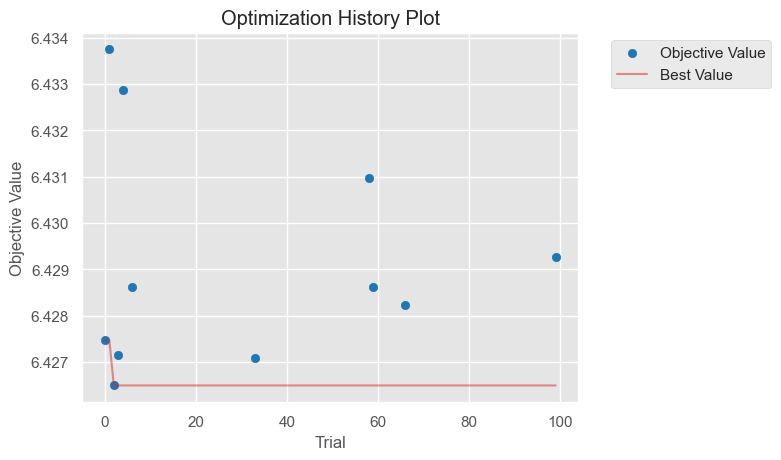

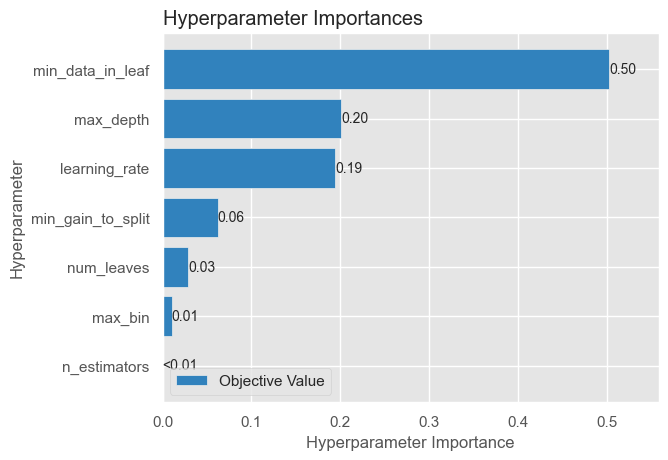

In [4]:
print(f"\tBest value (mse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")
plot_optimization_history(study)
plot_param_importances(study)

 cv = time series split of 10
 What does time series split do?

In [5]:
save_path = 'models_tuned2'
if not os.path.exists(save_path):
    os.makedirs(save_path)


def cross_val_score(estimator, cv=tss, label=''):

    X = train[~train.target.isna()]
    y = X.pop('target')

    # initiate prediction arrays and score lists
    val_predictions = np.zeros((len(X)))
    # train_predictions = np.zeros((len(sample)))
    train_scores, val_scores = [], []
    best_model = None
    best_model_train_score = 0
    best_val_score = 0

    # training model, predicting prognosis probability, and evaluating metrics
    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y)):

        model = clone(estimator)

        # define train set
        X_train = X.iloc[train_idx]
        y_train = y.iloc[train_idx]

        # define validation set
        X_val = X.iloc[val_idx]
        y_val = y.iloc[val_idx]

        # train model
        model.fit(X_train, y_train)

        # Save the model
        joblib.dump(model, f'./{save_path}/{label}_{fold}.model')

        # make predictions
        train_preds = model.predict(X_train)
        val_preds = model.predict(X_val)

        val_predictions[val_idx] += val_preds

        # evaluate model for a fold
        train_score = mean_absolute_error(y_train, train_preds)
        val_score = mean_absolute_error(y_val, val_preds)

        # Update best model
        if best_val_score == 0 or val_score < best_val_score:
            best_val_score = val_score
            best_model_train_score = train_score
            best_model = model

        # append model score for a fold to list
        train_scores.append(train_score)
        val_scores.append(val_score)

    # This line print the average
    print(f'Val Score: {np.mean(val_scores):.5f} ± {np.std(val_scores):.5f} | Train Score: {np.mean(train_scores):.5f} ± {np.std(train_scores):.5f} | {label}')
    # Print best model score
    print(
        f'Best validation score: {best_val_score}, associated train score: {best_model_train_score}')
    joblib.dump(best_model, f'./{save_path}/best_model.model')

    return val_scores, val_predictions

In [6]:
models = [
    ('LightGBM', LGBMRegressor(random_state=seed, objective='mse', device_type='gpu',
     **study.best_params))
]

for (label, model) in models:
    _ = cross_val_score(
        make_pipeline(
            model
        ),
        label=label
    )

[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.5121220950451078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121220950451078
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 940
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense

KeyboardInterrupt: 

 Explore the model trained
 Job saved is a pipeline, the model is in second step

In [ ]:
pipeline = joblib.load("./models/best_model.model")
trained_model = pipeline[0]
print(trained_model)

lgb.plot_importance(trained_model, importance_type="gain", figsize=(
    7, 8), precision=0, title="LightGBM Feature Importance (Gain)")
plt.show()
# feature_importance = model.feature_importances_
# Get column name as list for feature
# feature_names = list(train.columns.values)
# gain_importance_df = pd.DataFrame({'Feature':feature_names, 'Gain': feature_importance})
# print(gain_importance_df.sort_values(by='Gain', ascending=False))
lgb.plot_importance(trained_model, importance_type="split", figsize=(
    7, 8), precision=0, title="LightGBM Feature Importance (Split)")
plt.show()

: 